In [16]:
#statusDystonicus__manuscript.ipynb
#Initial code comparing Status Dystonicus to non-Status Dystonicus states, comparing various frequency band powers
#This extracts the recording data from the LFP files, and calculates the metrics of interest, including band-limited powers and periodic/aperiodic components
#Of note, non-SD is often referred to as oneYear, although patients non-SD recordings could be at anytime in the non-SD period
#Arjun Balachandar Aug 2024

#Directories and File Names
PATH = #change directory path accordingly
lfpDir = PATH + 'data_processed/'
clinVarFile = PATH + 'statusDystonicusDates_NEW.csv'#PATH + 'statusDystonicusDates.csv'
implantDateFile = PATH + 'patientSummary.csv'
extraSDDatesFile = PATH + 'statusDystonicusDates_EXTRADATES.csv'
optimalChannelsFile = PATH + 'AvailabilitySummary - with optimal channels - deidentified.xlsx' # Determined in consultation with Dr George Ibrahim
resultsDir = PATH + 'Analysis/'
resultsLFPPowersDir = resultsDir + 'LFP Powers/'
resultsPSDsDir = resultsDir + 'PSDs/'
resultsPSDPeaksDir = resultsDir + 'PSDPeaks/'
resultsFilename = 'powerChangesAfterCuringStatusDystonicus.csv'
resultsPSDFilename = 'PSDsAfterCuringStatusDystonicus.csv'
resultsCohDir = resultsDir + 'Coherence/'
resultsCohFilename = 'coherenceAfterCuringStatusDystonicus.csv'

#Frequency bands
betaLim = [12.5, 30] # In Hertz, define the beta band
thetaLim = [3, 7] # 3.5-7 as per Mark, Was [4,7] before 31 Jan
deltaLim = [1,3]
alphaLim = [7,12.5]
gammaLim = [30,60]
lowbetaLim = [12.5, 20]
highbetaLim = [20, 30]
lowgammaLim = [30, 40]
highgammaLim = [40, 60]
channelOverride = False
z_score_norm = False 
normalize_PSD = True #Normalize the PSD values by dividing by sum of total power of PSD

# Initializations
import os
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
from scipy import signal
from scipy.signal import welch
import matplotlib.pyplot as plt
import scipy.stats as stats
import re #regular expression
import neurodsp
from neurodsp.utils.norm import normalize_sig
from neurodsp.utils import create_times
from neurodsp.plts.time_series import plot_time_series, plot_instantaneous_measure
from sklearn.preprocessing import StandardScaler
import itertools

diff = lambda x, y: y - x

clinVars_df = pd.read_csv(clinVarFile, delimiter=',')
implantDates_df = pd.read_csv(implantDateFile, delimiter=',')
extraSDDates_df = pd.read_csv(extraSDDatesFile, delimiter=',')
patList = clinVars_df['Subject ID'].values
results = pd.DataFrame() #Final output of LFP power values, divided into spectra
results_PSD = pd.DataFrame() #Final output of PSDs for each patient at each time point

patList

array(['DBS003', 'DBS005', 'DBS013', 'DBS014', 'DBS018', 'DBS021',
       'DBS036', 'DBS047', 'DBS050', 'DBS039'], dtype=object)

In [17]:
def getWelch(theSig,fs):
    mid50lim = np.percentile(theSig, [25, 75])     # Keeps the middle 50% - not winsorizes
    data_mid50 = [x for x in theSig if x >= mid50lim[0] and x <= mid50lim[1]]
    std_mid50 = np.std(data_mid50) # standard deviation of the middle 50% of data
    theSig = [x for x in theSig if x >= mid50lim[0] - 5*std_mid50 and x <= mid50lim[1] + 5*std_mid50] # Throws away data that is more than 5 standard deviations from the extrema of the middle 50% of data
    #theSig = np.convolve(theSig, np.ones(5)/5, mode='same') # Artefacts tend to last a while, so median filter not appropriate
    #theSig = stats.mstats.winsorize(np.array(theSig), limits=[0.05, 0.05])
    #print('Processing channel', channel, 'for patient', subjID, 'in', intervalType, 'segment from', segment[0], 'for',duration,'seconds')
    freqs, psd = welch(theSig, fs=fs, nperseg=256) # Calculate spectral power using Welch method
    #freqs, psd = welch(theSig, fs=fs, nperseg=256, window='hamming') # Calculate spectral power using Welch method
    return freqs, psd,data_mid50,std_mid50

In [19]:
# Compute spectral power for each patient

recording_durations = []

for subjID in patList:
    # For patients with extra recordings, to add on to original recordings
    timeseries_NEW_df = pd.DataFrame()
    timeseries_NEW2_df = pd.DataFrame()
    file_path_NEW = ''
    file_path_NEW2 = ''

    # Load the timeseries data for the current patient
    file_path = os.path.join(lfpDir, f'{subjID}_timeseries.csv')
    if subjID in ['DBS005', 'DBS013', 'DBS018', 'DBS021', 'DBS036']:
        file_path_NEW = os.path.join(lfpDir, f'{subjID}_timeseries_NEW1.csv')

    print('Loading timeseries data for patient ' + subjID)
    timeseries_df = pd.read_csv(file_path, parse_dates=['DateTime (UTC)'], index_col='DateTime (UTC)')
    if file_path_NEW != '':
        timeseries_NEW_df = pd.read_csv(file_path_NEW, parse_dates=['DateTime (UTC)'], index_col='DateTime (UTC)')

    if file_path_NEW2 != '':
        timeseries_NEW2_df = pd.read_csv(file_path_NEW2, parse_dates=['DateTime (UTC)'], index_col='DateTime (UTC)')

    #combine the two dataframes timeseries_df and timeseries_NEW_df, if timeseries_NEW_df is not empty
    if not timeseries_NEW_df.empty:
        timeseries_df = pd.concat([timeseries_df, timeseries_NEW_df])
        timeseries_df = timeseries_df.loc[~timeseries_df.index.duplicated(keep='first')]
    if not timeseries_NEW2_df.empty:
        timeseries_df = pd.concat([timeseries_df, timeseries_NEW2_df])
        timeseries_df = timeseries_df.loc[~timeseries_df.index.duplicated(keep='first')]

    implantDate = implantDates_df.loc[implantDates_df['Patient ID'] == subjID, 'Implant date'].values[0]
    implantDate = datetime.strptime(implantDate, '%Y-%m-%d')

    registry_df = clinVars_df.copy()
    registry_df = registry_df.loc[registry_df['Subject ID'] == subjID]
    if registry_df.empty:
        print('No registry data for patient', subjID)
        continue
    if pd.isna(registry_df['Date of Status dystonicus'].values[0]):
        print('No status dystonicus data for patient', subjID)
        continue

    status_date = datetime.strptime(registry_df['Date of Status dystonicus'].values[0], '%d-%b-%y')
    startDate = max(status_date, implantDate)
    one_year_after = startDate + timedelta(days=365)
    discharge_date = datetime.strptime(registry_df['Date of Discharge'].values[0], '%d-%b-%y')

    # Extract extra status dystonicus dates
    extra_status_dates_str = extraSDDates_df.loc[extraSDDates_df['Subject ID'] == subjID, 'Date of Extra Status dystonicus'].values
    extra_status_dates = []
    if len(extra_status_dates_str) > 0 and not pd.isna(extra_status_dates_str[0]):
        extra_status_dates = [datetime.strptime(date.strip(), '%Y-%m-%d') for date in extra_status_dates_str[0].split(',')]

    # Filter recordings for status dystonicus (including extra dates)
    early_recordings = timeseries_df.loc[
        (timeseries_df.index >= startDate - timedelta(days=10)) &
        (timeseries_df.index <= startDate + timedelta(days=45))
    ]

    # Include recordings for each extra status date
    for extra_date in extra_status_dates:
        extra_recordings = timeseries_df.loc[
            (timeseries_df.index >= extra_date - timedelta(days=10)) &
            (timeseries_df.index <= extra_date + timedelta(days=45))
        ]
        early_recordings = pd.concat([early_recordings, extra_recordings])
        early_recordings = early_recordings.loc[~early_recordings.index.duplicated(keep='first')]

    # Filter recordings for one year later, explicitly excluding extra status dates
    excluded_dates = [(date - timedelta(days=10), date + timedelta(days=45)) for date in extra_status_dates]
    one_year_recordings = timeseries_df.loc[
        ((timeseries_df.index >= one_year_after - timedelta(days=270)) &
         (timeseries_df.index <= one_year_after + timedelta(days=10000))) |
        (timeseries_df.index < startDate - timedelta(days=15))
    ]

    # Exclude recordings that fall within any extra status dystonicus date range
    for start, end in excluded_dates:
        one_year_recordings = one_year_recordings.loc[
            (one_year_recordings.index < start) | (one_year_recordings.index > end)
        ]

    # Compute spectral power for each contiguous recording
    for intervalType, recordings in [('status', early_recordings), ('oneYear', one_year_recordings)]:
        if not recordings.empty:
            contiguous_segments = []
            current_segment = []
            for time, data in recordings.iterrows():
                if not current_segment or (time - current_segment[-1] < timedelta(seconds=2)):
                    current_segment.append(time)
                else:
                    contiguous_segments.append(current_segment)
                    current_segment = [time]
            if current_segment:
                contiguous_segments.append(current_segment)

            for segment in contiguous_segments:
                segment_data = recordings.loc[segment[0]:segment[-1]]
                fs = 1 / (segment_data.index[1] - segment_data.index[0]).total_seconds()
                startStr = segment[0].strftime('%Y-%m-%d %H:%M:%S')
                duration = np.round((segment[-1] - segment[0]).total_seconds())
                recType = segment_data['Type'].values[0]

                for channel in segment_data.columns[1:]:
                    channel_data = segment_data[channel].values
                    channel_data_nonblanks = [x for x in channel_data if not pd.isna(x)]
                    if all([pd.isna(x) for x in channel_data]) or len(channel_data_nonblanks) <= 2:
                        continue

                    if z_score_norm:
                        mean = np.mean(channel_data_nonblanks)
                        std_dev = np.std(channel_data_nonblanks)
                        channel_data_norm = [(x - mean) / std_dev for x in channel_data_nonblanks]
                    else:
                        channel_data_norm = channel_data_nonblanks

                    #Calculate length in seconds of the recording
                    num_samples = len(channel_data_norm)
                    duration_seconds = num_samples / fs
                    recording_durations.append(duration_seconds)

                    freqs, psd, data_mid50, std_mid50 = getWelch(channel_data_norm, fs=fs)

                    if normalize_PSD:
                        psd = psd / np.sum(psd)

                    thetaFreqs = [i for i, x in enumerate(freqs) if thetaLim[0] <= x <= thetaLim[1]]
                    betaFreqs = [i for i, x in enumerate(freqs) if betaLim[0] <= x <= betaLim[1]]
                    alphaFreqs = [i for i, x in enumerate(freqs) if alphaLim[0] <= x <= alphaLim[1]]
                    deltaFreqs = [i for i, x in enumerate(freqs) if deltaLim[0] <= x <= deltaLim[1]]
                    gammaFreqs = [i for i, x in enumerate(freqs) if gammaLim[0] <= x <= gammaLim[1]]
                    lowbetaFreqs = [i for i, x in enumerate(freqs) if lowbetaLim[0] <= x <= lowbetaLim[1]]
                    highbetaFreqs = [i for i, x in enumerate(freqs) if highbetaLim[0] <= x <= highbetaLim[1]]
                    lowgammaFreqs = [i for i, x in enumerate(freqs) if lowgammaLim[0] <= x <= lowgammaLim[1]]
                    highgammaFreqs = [i for i, x in enumerate(freqs) if highgammaLim[0] <= x <= highgammaLim[1]]

                    delta_power = sum(psd[deltaFreqs])
                    theta_power = sum(psd[thetaFreqs])
                    alpha_power = sum(psd[alphaFreqs])
                    beta_power = sum(psd[betaFreqs])
                    gamma_power = sum(psd[gammaFreqs])
                    lowbeta_power = sum(psd[lowbetaFreqs])
                    highbeta_power = sum(psd[highbetaFreqs])
                    lowgamma_power = sum(psd[lowgammaFreqs])
                    highgamma_power = sum(psd[highgammaFreqs])

                    #Store the power values for each patient at each time point for all freq bands
                    resultRow = pd.DataFrame({'Patient': [subjID], 'Implant date': [implantDate], 'StatusDysStart': [status_date], 'Discharge': [discharge_date], 'RecordingStartTime': [startStr], 'IntervalType': [intervalType], 'RecordingType': [recType], 'Channel': [channel], 'DeltaPower': [delta_power], 'ThetaPower': [theta_power], 'AlphaPower': [alpha_power], 'BetaPower': [beta_power], 'GammaPower': [gamma_power], 'LowBetaPower': [lowbeta_power], 'HighBetaPower': [highbeta_power], 'LowGammaPower': [lowgamma_power], 'HighGammaPower': [highgamma_power]})
                    if results.empty:
                        results = resultRow
                    else:
                        results = pd.concat([results, resultRow])
                    # Store the PSDs for each patient at each time point
                    columns = ['Patient', 'Implant date', 'StatusDysStart', 'Discharge', 'RecordingStartTime', 'IntervalType', 'RecordingType', 'Channel'] + freqs.tolist()
                    resultsRow_PSD_headers = pd.DataFrame(columns=columns)
                    resultsRow_PSD = pd.DataFrame([[subjID, implantDate, status_date, discharge_date, startStr, intervalType, recType, channel] + psd.tolist()], columns=columns)
                    if results_PSD.empty:
                        results_PSD = resultsRow_PSD
                    else:
                        results_PSD = pd.concat([results_PSD, resultsRow_PSD])
                    
result_df = pd.DataFrame(results)
result_PSD_df = pd.DataFrame(results_PSD)

average_recording_duration = np.mean(recording_durations)
# Calculate the standard deviation of durations
std_deviation_duration = np.std(recording_durations)
print(f"Average Duration: {average_recording_duration} seconds")
print(f"Standard Deviation of Duration: {std_deviation_duration} seconds")

# Determine the range
min_value = min(recording_durations)
max_value = max(recording_durations)
# Print the results
print(f"Minimum recording: {min_value}")
print(f"Maximum recording: {max_value}")

print(result_df)
result_df.to_csv(resultsDir + resultsFilename, index=False)

print(result_PSD_df)
result_PSD_df.to_csv(resultsDir + resultsPSDFilename, index=False)

Loading timeseries data for patient DBS003
Loading timeseries data for patient DBS005
Loading timeseries data for patient DBS013
Loading timeseries data for patient DBS014
Loading timeseries data for patient DBS018
Loading timeseries data for patient DBS021
Loading timeseries data for patient DBS036
Loading timeseries data for patient DBS047
Loading timeseries data for patient DBS050
Loading timeseries data for patient DBS039
Average Duration: 103.72982049469967 seconds
Standard Deviation of Duration: 118.5814805176235 seconds
Minimum recording: 2.0
Maximum recording: 545.752
   Patient Implant date StatusDysStart  Discharge   RecordingStartTime  \
0   DBS003   2021-01-12     2021-01-12 2021-02-18  2021-01-13 17:13:19   
0   DBS003   2021-01-12     2021-01-12 2021-02-18  2021-01-13 17:13:19   
0   DBS003   2021-01-12     2021-01-12 2021-02-18  2021-01-13 17:13:19   
0   DBS003   2021-01-12     2021-01-12 2021-02-18  2021-01-13 17:13:19   
0   DBS003   2021-01-12     2021-01-12 2021-02-

In [20]:
#***Split data into individual patient files, based on optimal target***
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

# Extract data represented by columns in x for each patient separately
optimalChannels = pd.read_excel(optimalChannelsFile, sheet_name='SummaryOfAvailabilities')

#Load individual spectral power data
df = pd.read_csv(resultsDir + resultsFilename)

patList = df['Patient'].unique()

#Load whole PSD data
PSD_df = pd.read_csv(resultsDir + resultsPSDFilename)

baselineBuffer = timedelta(days=3)

for hemisphere in ['LEFT', 'RIGHT']:
    for patient in patList:
        patient_data = df[df['Patient'] == patient]
        if patient_data.empty:
            print('No data for patient', patient)
            continue
        implantDate = patient_data['Implant date'].iloc[0]
        implantDate = datetime.strptime(implantDate, '%Y-%m-%d')
        discharge_date = patient_data['Discharge'].iloc[0]
        discharge_date = datetime.strptime(discharge_date, '%Y-%m-%d')
        last_day_of_baseline = discharge_date - baselineBuffer # gives a margin in case patient discharged was delayed
        if patient == 'DBS013':
            startDate = patient_data['StatusDysStart'].iloc[0]
            startDate = datetime.strptime(startDate, '%Y-%m-%d')
        else:
            startDate = implantDate
        channelField = 'Optimal channel (' + hemisphere[0] + ')'
        hemisphere_channels = optimalChannels[optimalChannels['Patient'] == patient][channelField].values # Now chooses just one channel per hemisphere
        if channelOverride: #this is never selected, but for troubleshooting can override the optimal channel for ALL patients, if true
            hemisphere_channels = ['ONE_THREE']

        hemisphere_channels = [str(hemisphere_channels[0])]
        if hemisphere_channels[0] == 'nan' or hemisphere_channels[0] == 'CACHED' or hemisphere_channels[0] == 'Not needed – no LFPs':
            print('No optimal channel for patient', patient)
            hemisphere_channels = ['ONE_THREE']

        #optimal channel for specific patients
        if patient == 'DBS036' and hemisphere == 'LEFT':
            hemisphere_channels = ['ZERO_THREE']
        if patient == 'DBS009' and hemisphere == 'RIGHT':
            hemisphere_channels = ['ZERO_THREE']
        if patient == 'DBS014' and hemisphere == 'LEFT':
            hemisphere_channels = ['ZERO_TWO']
        if patient == 'DBS013' and hemisphere == 'RIGHT':
            hemisphere_channels = ['ONE_THREE']
        if patient == 'DBS021' and hemisphere == 'LEFT':
            hemisphere_channels = ['ZERO_TWO']
        if patient == 'DBS021' and hemisphere == 'RIGHT':
            hemisphere_channels = ['ZERO_TWO']     
        if patient == 'DBS005' and hemisphere == 'LEFT':
            hemisphere_channels = ['ONE_THREE']
        if patient == 'DBS005' and hemisphere == 'RIGHT':
            hemisphere_channels = ['TWO_THREE']
        if patient == 'DBS047' and hemisphere == 'LEFT':
            hemisphere_channels = ['ZERO_TWO']
        if patient == 'DBS050' and hemisphere == 'LEFT':
            hemisphere_channels = ['ZERO_TWO']
        if patient == 'DBS039' and hemisphere == 'LEFT':
            hemisphere_channels = ['ONE_THREE']
        if patient == 'DBSB01' and hemisphere == 'LEFT':
            hemisphere_channels = ['ZERO_THREE']
        if patient == 'DBSB01' and hemisphere == 'RIGHT':
            hemisphere_channels = ['ZERO_THREE']
        channel = hemisphere_channels[0] + '_' + hemisphere #define channel name, to extract data for this channel

        #Channel individual spectral power data for the patient
        channel_data = patient_data[patient_data['Channel'] == channel]
        channel_data['IntervalType_numeric'] = channel_data['IntervalType'].replace({'status': 0, 'oneYear': 1})
        patientDataFileName = resultsLFPPowersDir + patient + '_' + hemisphere + '_LFPpowers.csv'
        channel_data.to_csv(patientDataFileName, index=False)

        patient_PSD_data = PSD_df[PSD_df['Patient'] == patient]
        if patient_PSD_data.empty:
            print('No PSD data for patient', patient)
            continue
        channel_PSD_data = patient_PSD_data[patient_PSD_data['Channel'] == channel]
        patientPSDDataFileName = resultsPSDsDir + patient + '_' + hemisphere + '_PSDs.csv'
        channel_PSD_data.to_csv(patientPSDDataFileName, index=False)

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/556713985.py:82: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  channel_data['IntervalType_numeric'] = channel_data['IntervalType'].replace({'status': 0, 'oneYear': 1})
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/556713985.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  channel_data['IntervalType_numeric'] = channel_data['IntervalType'].replace({'status': 0, 'oneYear': 1})
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel

No optimal channel for patient DBS013
No optimal channel for patient DBS014
No optimal channel for patient DBS021
No optimal channel for patient DBS013
No optimal channel for patient DBS014
No optimal channel for patient DBS021


/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/556713985.py:82: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  channel_data['IntervalType_numeric'] = channel_data['IntervalType'].replace({'status': 0, 'oneYear': 1})
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/556713985.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  channel_data['IntervalType_numeric'] = channel_data['IntervalType'].replace({'status': 0, 'oneYear': 1})


'\nfor \npower_data_df = df[\'Patient\'].unique()\npatient_data = {patient: df[df[\'Patient\'] == patient][x] for patient in patients}\n\n# Print the data for each patient\nfor patient, data in patient_data.items():\n    print(f"\nData for {patient}:")\n    print(data)\n    \n'

In [21]:
#(Not used in analysis, calculated as formality) ***ALSO split into individual channel data -> Split data into individual patient files***
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

hemisphere_channels_list = ['ZERO_THREE','ONE_THREE','ZERO_TWO','ZERO_ONE','ONE_TWO','TWO_THREE']

#Load individual spectral power data
df = pd.read_csv(resultsDir + resultsFilename)
patList = df['Patient'].unique()

#Load whole PSD data
PSD_df = pd.read_csv(resultsDir + resultsPSDFilename)

#patList = ['DBS003'] # uncomment if you want to focus on a participant(s)
baselineBuffer = timedelta(days=3)

for hemisphere in ['LEFT', 'RIGHT']:
    for patient in patList:
        patient_data = df[df['Patient'] == patient]
        if patient_data.empty:
            print('No data for patient', patient)
            continue
        implantDate = patient_data['Implant date'].iloc[0]
        implantDate = datetime.strptime(implantDate, '%Y-%m-%d')
        discharge_date = patient_data['Discharge'].iloc[0]
        discharge_date = datetime.strptime(discharge_date, '%Y-%m-%d')
        last_day_of_baseline = discharge_date - baselineBuffer # gives a margin in case patient discharged was delayed
        if patient == 'DBS013':
            startDate = patient_data['StatusDysStart'].iloc[0]
            startDate = datetime.strptime(startDate, '%Y-%m-%d')
        else:
            startDate = implantDate
        
        #Iterate through each channel type and store the LFP band and PSD data
        for hemisphere_channels in hemisphere_channels_list:
            channel = hemisphere_channels + '_' + hemisphere

            #Channel individual spectral power data for the patient
            channel_data = patient_data[patient_data['Channel'] == channel]
            patientDataFileName = resultsLFPPowersDir + patient + '_' + hemisphere + '_' + hemisphere_channels + '_LFPpowers.csv'
            channel_data.to_csv(patientDataFileName, index=False)

            patient_PSD_data = PSD_df[PSD_df['Patient'] == patient]
            if patient_PSD_data.empty:
                print('No PSD data for patient', patient)
                continue
            #Channel full PSD data for the patient
            channel_PSD_data = patient_PSD_data[patient_PSD_data['Channel'] == channel]
            patientPSDDataFileName = resultsPSDsDir + patient + '_' + hemisphere + '_' + hemisphere_channels + '_PSDs.csv'
            channel_PSD_data.to_csv(patientPSDDataFileName, index=False)


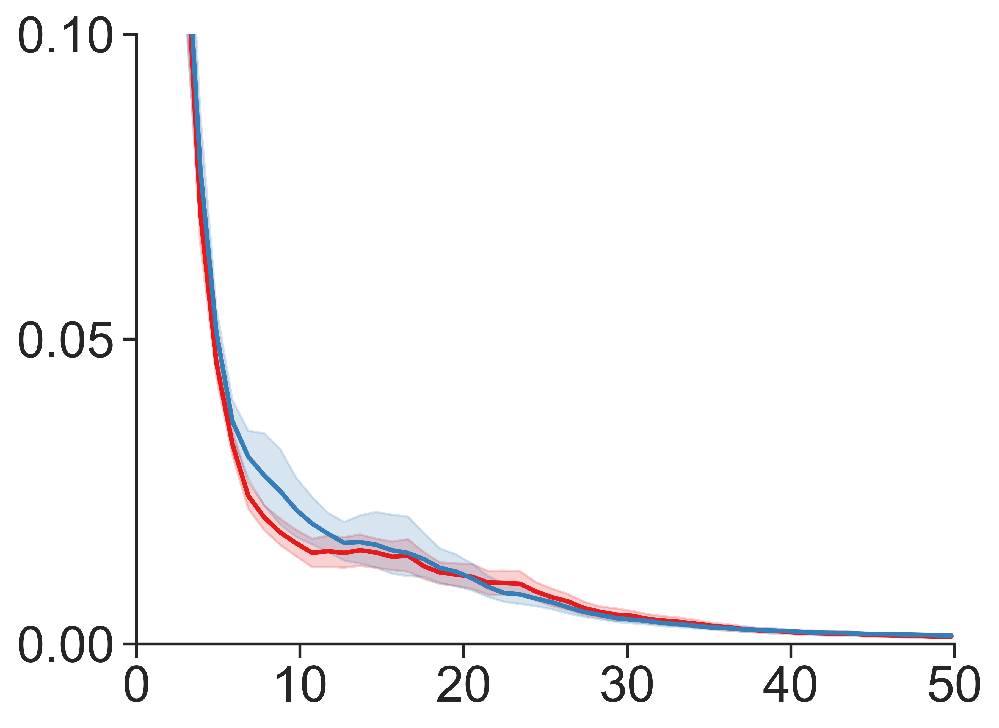

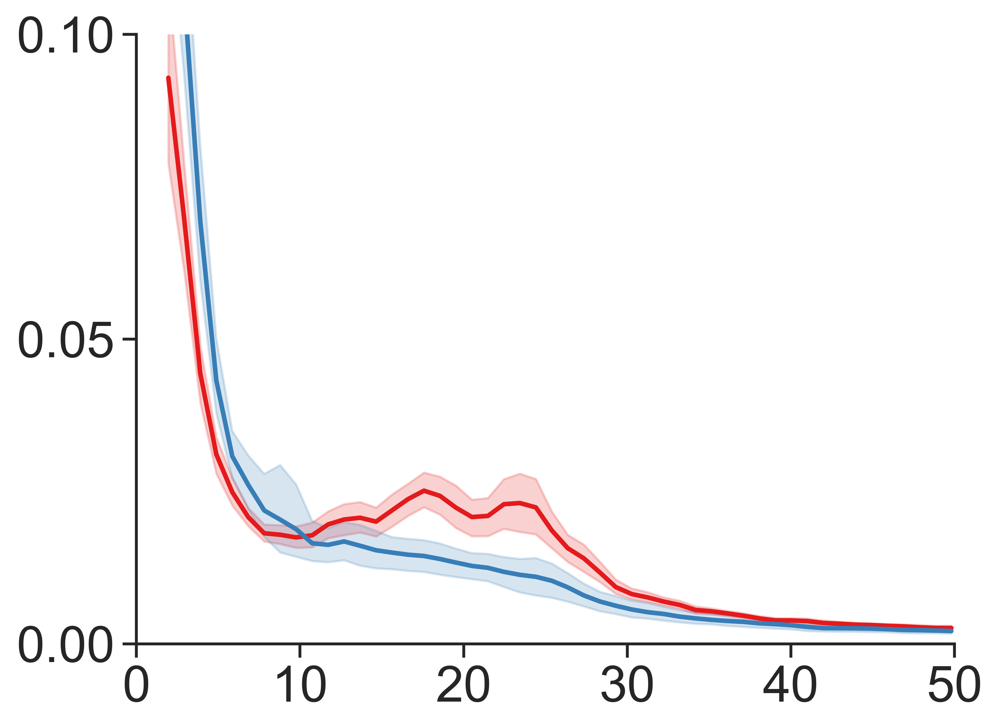

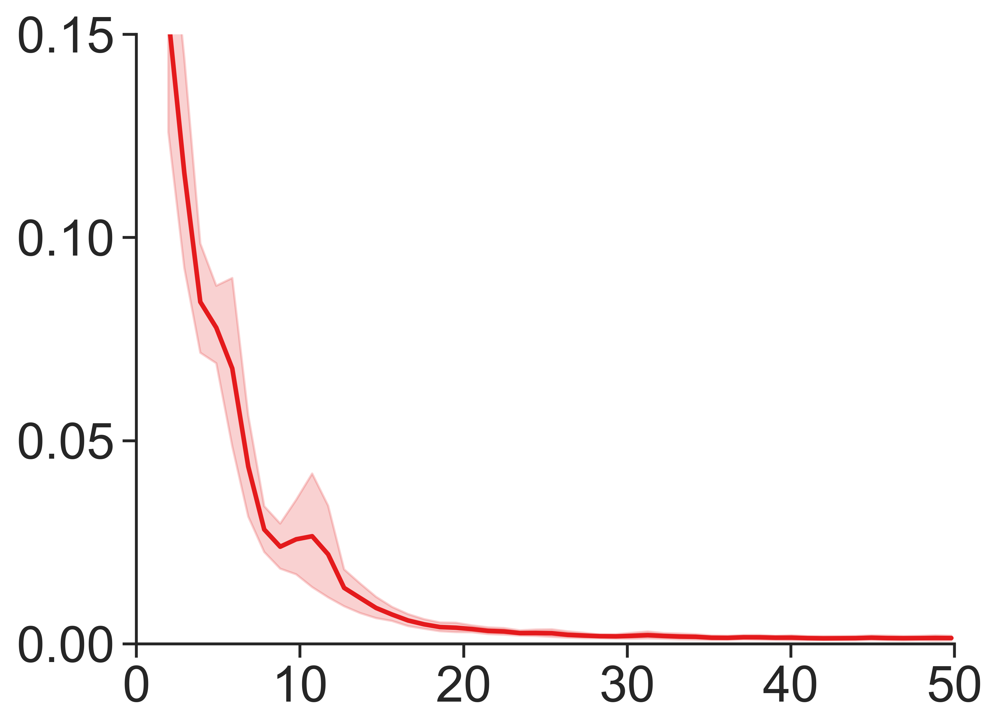

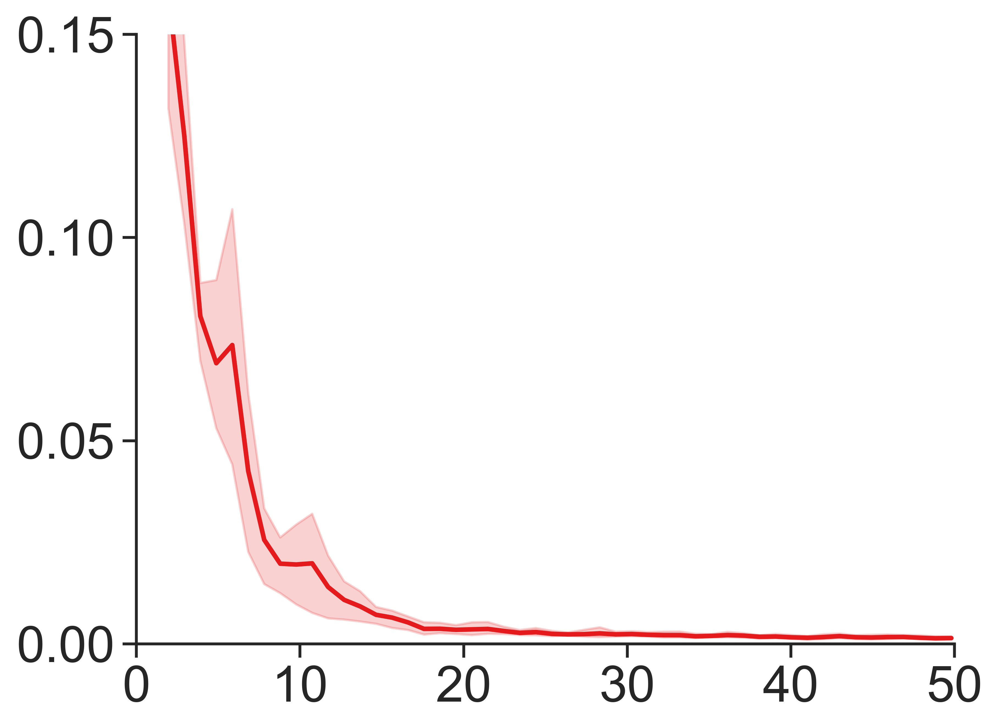

In [ ]:
#PLOT ALL PSDs FOR OPTIMAL CHANNEL FOR EACH PATIENT AS ONE PLOT IN SEABORN
import seaborn as sns
import matplotlib.lines as mlines

PSD_df = pd.read_csv(resultsDir + resultsPSDFilename)
PSD_df['RecordingType'] = PSD_df['RecordingType'].replace('CT', 'CT (stim on)')

patList = PSD_df['Patient'].unique()

plt.rcParams['figure.dpi'] = 600

for patient in patList:
    for hemisphere in ['LEFT', 'RIGHT']:
        patient_data = PSD_df[df['Patient'] == patient]
        if patient_data.empty:
            print('No data for patient', patient)
            continue
        patientPSDDataFileName = resultsPSDsDir + patient + '_' + hemisphere + '_PSDs.csv'
        patient_PSD_df = pd.read_csv(patientPSDDataFileName)

        #just get the Interval type (Status vs OneYear) and PSD powers for each patient
        PSD_IDpowers = patient_PSD_df.drop(['Patient','Implant date','StatusDysStart','Discharge','RecordingStartTime','RecordingType','Channel'], axis=1)
        #only get the columns in the dataframe that have numbers as column names - these are the columns that have frequency values as their names
        freqs = [col for col in patient_PSD_df.columns if re.search(r'\d', col)]
        freqs_np = np.array(freqs)

        all_psds_melted = PSD_IDpowers.melt(id_vars=['IntervalType'], var_name = 'frequency', value_name = 'psd')
        all_psds_melted['frequency'] = all_psds_melted['frequency'].astype(float)

        #filter just 1-50Hz now, and only plot those
        all_psds_melted_filt = all_psds_melted[(all_psds_melted['frequency'] >= 1) & (all_psds_melted['frequency'] <= 50)]
        sns.set_style("ticks")
        sns.set_context("notebook", font_scale=2.0, rc={"lines.linewidth": 2.0})
        ax = sns.lineplot(data=all_psds_melted_filt, x='frequency', y='psd', hue='IntervalType', palette='Set1', legend=False, errorbar=('ci', 95))
        plt.xlim(1, 50)  # Set the x-axis limits from 1 to 50
        plt.xticks(np.arange(0, 60, 10), rotation=0)  # Set x-ticks starting from 0 to 50 with steps of 5

        if patient == 'DBS036':
            plt.ylim(0, 0.20)  # Set the y-axis limits from 0 to 0.10
            plt.yticks(np.arange(0, 0.25, 0.10))  # Set y-ticks from 0 to 0.14 with steps of 0.05
            plt.gca().set_yticklabels([f'{tick:.2f}' for tick in np.arange(0, 0.25, 0.10)])  # Format y-tick labels with two decimals
        
        if patient == 'DBS003' or patient == 'DBS014' or patient == 'DBS021' or patient == 'DBS047' or patient == 'DBS050':
            plt.ylim(0, 0.10)  # Set the y-axis limits from 0 to 0.10
            plt.yticks(np.arange(0, 0.15, 0.05))  # Set y-ticks from 0 to 0.14 with steps of 0.05

        if patient == 'DBS005' or patient == 'DBS013' or patient == 'DBS018':
            plt.ylim(0, 0.15)  # Set the y-axis limits from 0 to 0.10
            plt.yticks(np.arange(0, 0.20, 0.05))  # Set y-ticks from 0 to 0.14 with steps of 0.05

        if patient == 'DBS039':
            plt.ylim(0, 0.20)  # Set the y-axis limits from 0 to 0.10
            plt.yticks(np.arange(0, 0.25, 0.10))  # Set y-ticks from 0 to 0.14 with steps of 0.05
            plt.gca().set_yticklabels([f'{tick:.2f}' for tick in np.arange(0, 0.25, 0.10)])  # Format y-tick labels with two decimals

        ax.set(xlabel=None)
        ax.set(ylabel=None)

        sns.despine()
        plt.show()

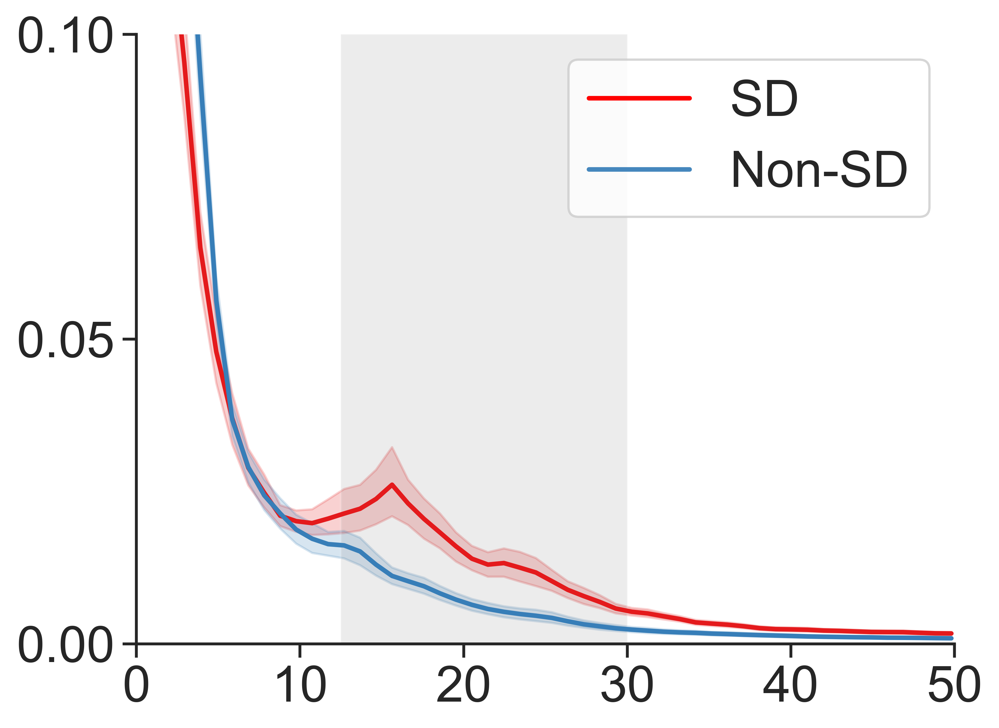

In [6]:
#PLOT CUMULATIVE PLOT OF ALL PSDs ACROSS ALL PATIENTS IN ONE PLOT
import seaborn as sns
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

PSD_df = pd.read_csv(resultsDir + resultsPSDFilename)
PSD_df['RecordingType'] = PSD_df['RecordingType'].replace('CT', 'CT (stim on)')

patList = PSD_df['Patient'].unique() #patList = ['DBS003'], hemisphere = 'RIGHT'

cumulative_all_psds_melted = pd.DataFrame() #initialize empty dataframe to store all PSDs for all patients in one

for patient in patList:
    for hemisphere in ['LEFT', 'RIGHT']:
        if (patient=='DBS003' and hemisphere=='LEFT') or (patient=='DBS009') or (patient=='DBS021' and hemisphere=='LEFT') or (patient=='DBS013' and hemisphere=='LEFT') or (patient=='DBS005' and hemisphere=='LEFT') or (patient=='DBS014' and hemisphere=='RIGHT') or (patient=='DBS036' and hemisphere=='LEFT') or (patient=='DBS018') or (patient=='DBS047' and hemisphere=='RIGHT') or (patient=='DBS050' and hemisphere=='RIGHT') or (patient=='DBS039' and hemisphere=='RIGHT'):
            continue
    

        patient_data = PSD_df[df['Patient'] == patient]
        if patient_data.empty:
            print('No data for patient', patient)
            continue
        patientPSDDataFileName = resultsPSDsDir + patient + '_' + hemisphere + '_PSDs.csv'
        patient_PSD_df = pd.read_csv(patientPSDDataFileName)

        #just get the Interval type (Status vs OneYear) and PSD powers for each patient
        PSD_IDpowers = patient_PSD_df.drop(['Patient','Implant date','StatusDysStart','Discharge','RecordingStartTime','RecordingType','Channel'], axis=1)
        #only get the columns in the dataframe that have numbers as column names - these are the columns that have frequency values as their names
        freqs = [col for col in patient_PSD_df.columns if re.search(r'\d', col)]
        freqs_np = np.array(freqs)

        all_psds_melted = PSD_IDpowers.melt(id_vars=['IntervalType'], var_name = 'frequency', value_name = 'psd')
        all_psds_melted['frequency'] = all_psds_melted['frequency'].astype(float)

        cumulative_all_psds_melted = pd.concat([cumulative_all_psds_melted, all_psds_melted])


# Plot desired frequency range
cumulative_all_psds_melted_filt = cumulative_all_psds_melted[
    (cumulative_all_psds_melted['frequency'] >= 1) & 
    (cumulative_all_psds_melted['frequency'] <= 50)
]

sns.set_style("ticks")
sns.set_context("notebook", font_scale=2.0, rc={"lines.linewidth": 2.0})

ax = sns.lineplot(
    data=cumulative_all_psds_melted_filt, 
    x='frequency', 
    y='psd', 
    hue='IntervalType', 
    legend=False, 
    palette='Set1', 
    errorbar=('ci', 95),
)

# Add a grey shaded box for beta-band, covering the entire y-axis range
plt.axvspan(12.5, 30, facecolor='grey', alpha=0.15)

# Customize the plot
plt.xlim(1, 50)
plt.xticks(np.arange(0, 60, 10), rotation=0)
plt.ylim(0, 0.10)
plt.yticks(np.arange(0, 0.15, 0.05))


sd_line = mlines.Line2D([], [], color='red', label='SD')
non_sd_line = mlines.Line2D([], [], color='#4587BD', label='Non-SD')

# Add a custom legend with the line handles only
plt.legend(
    handles=[sd_line, non_sd_line],
    loc='upper right'
)

ax.set(xlabel=None)
ax.set(ylabel=None)

sns.despine()
plt.show()


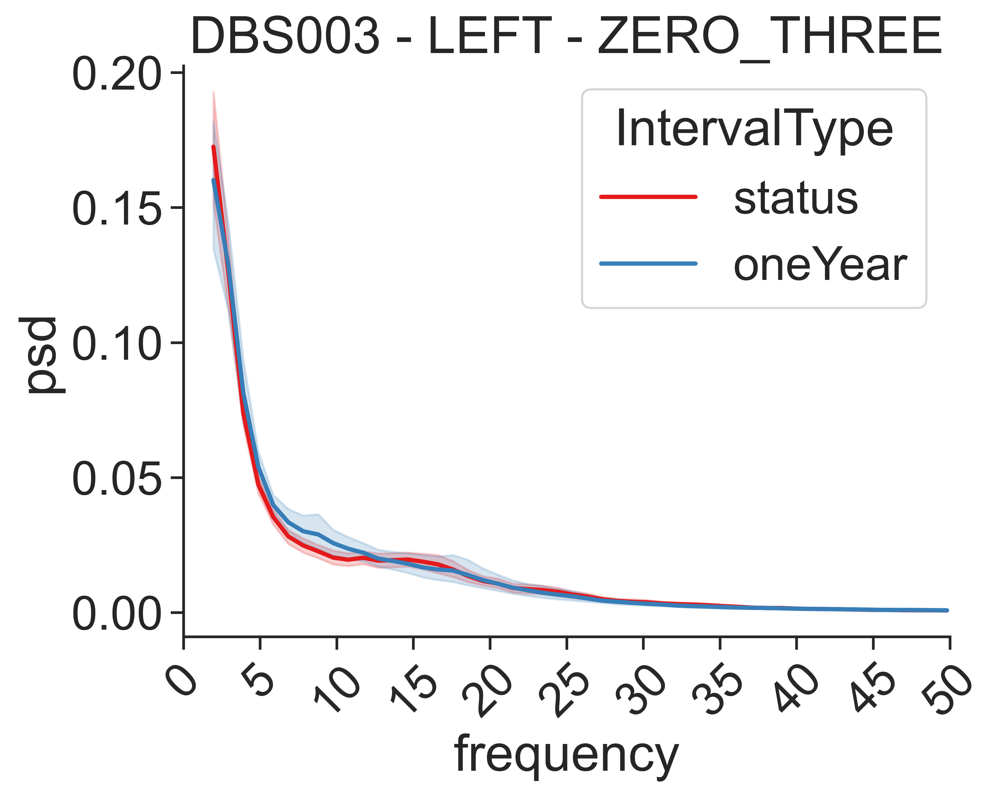

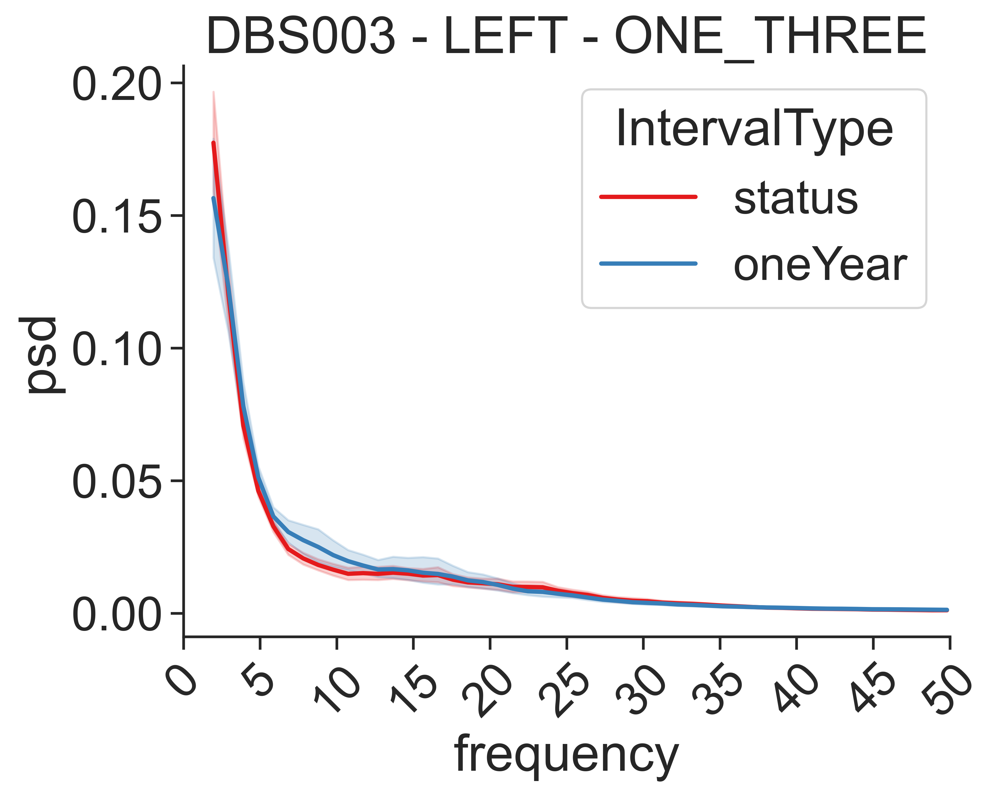

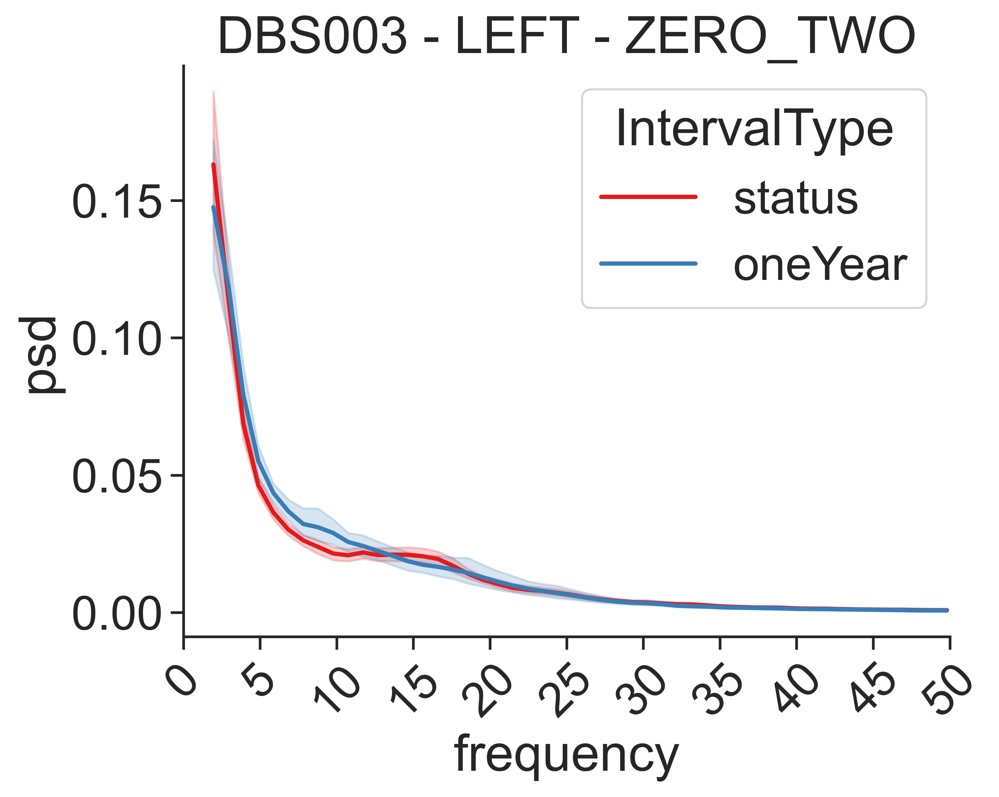

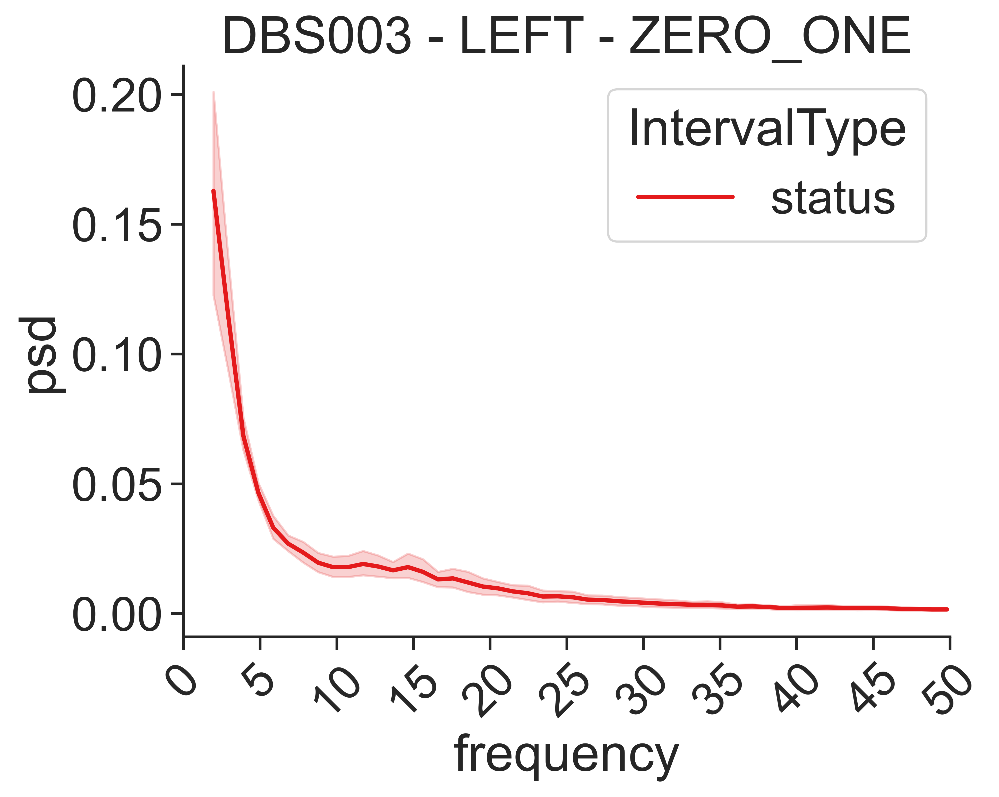

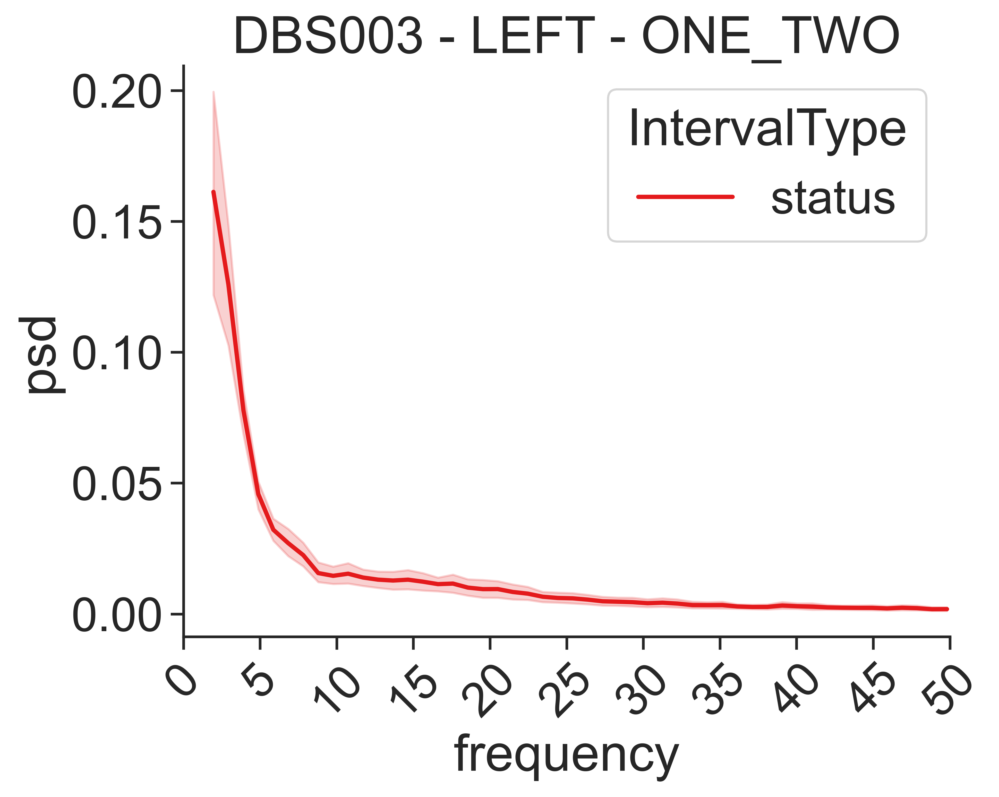

...

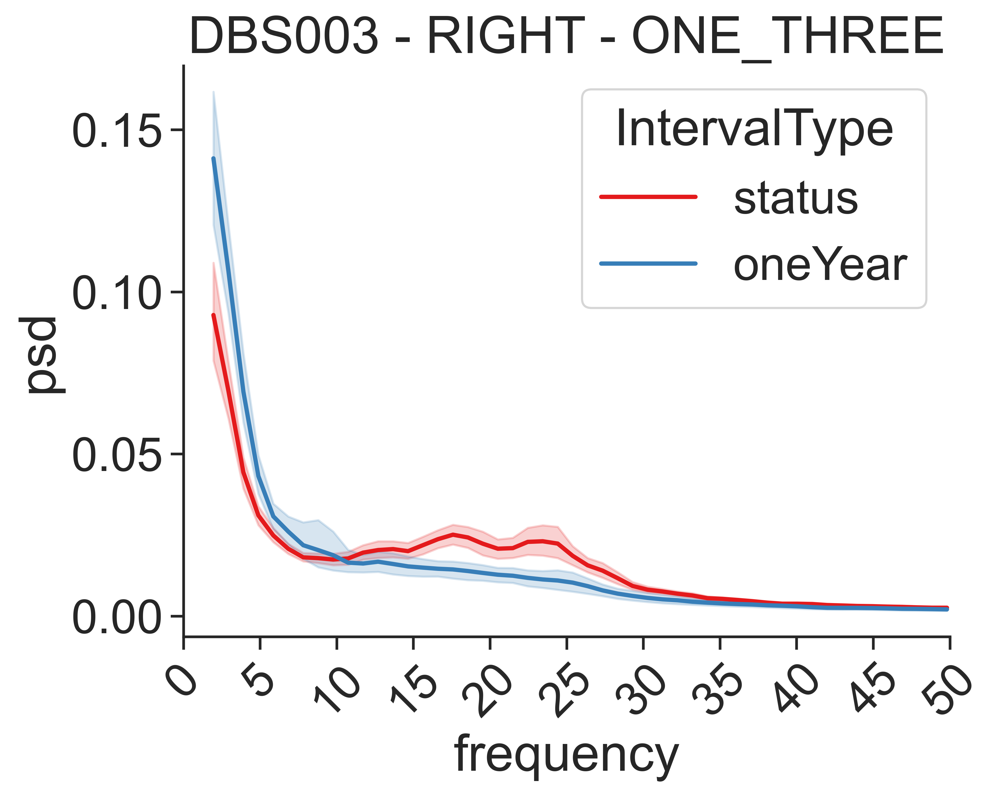

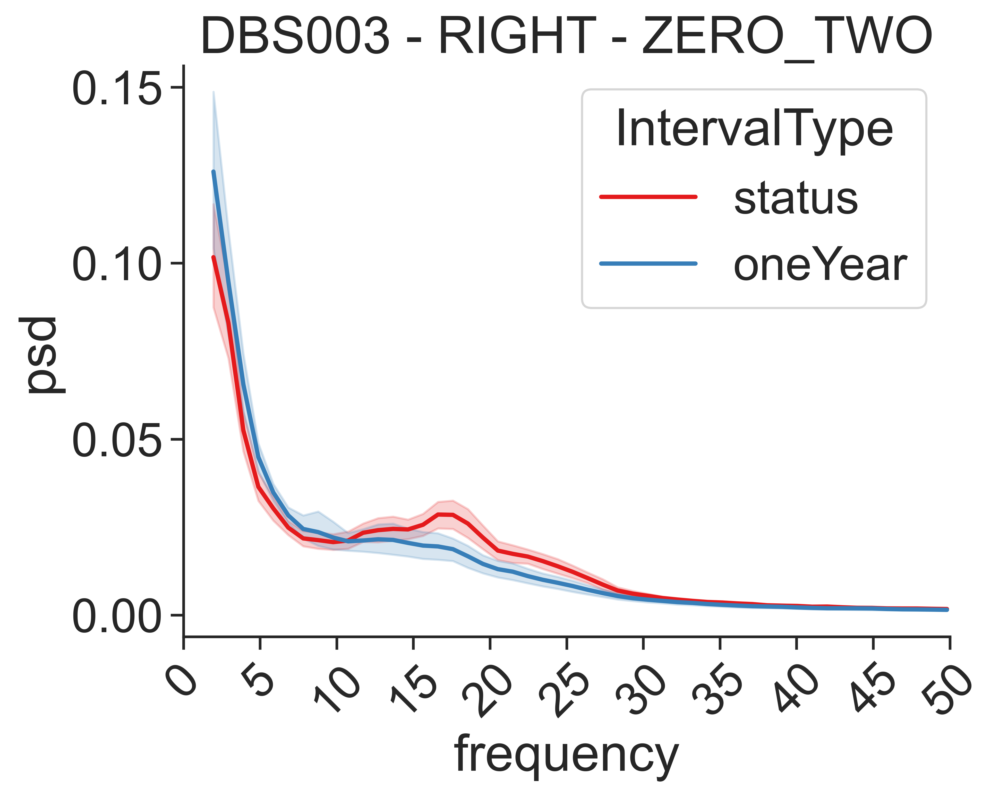

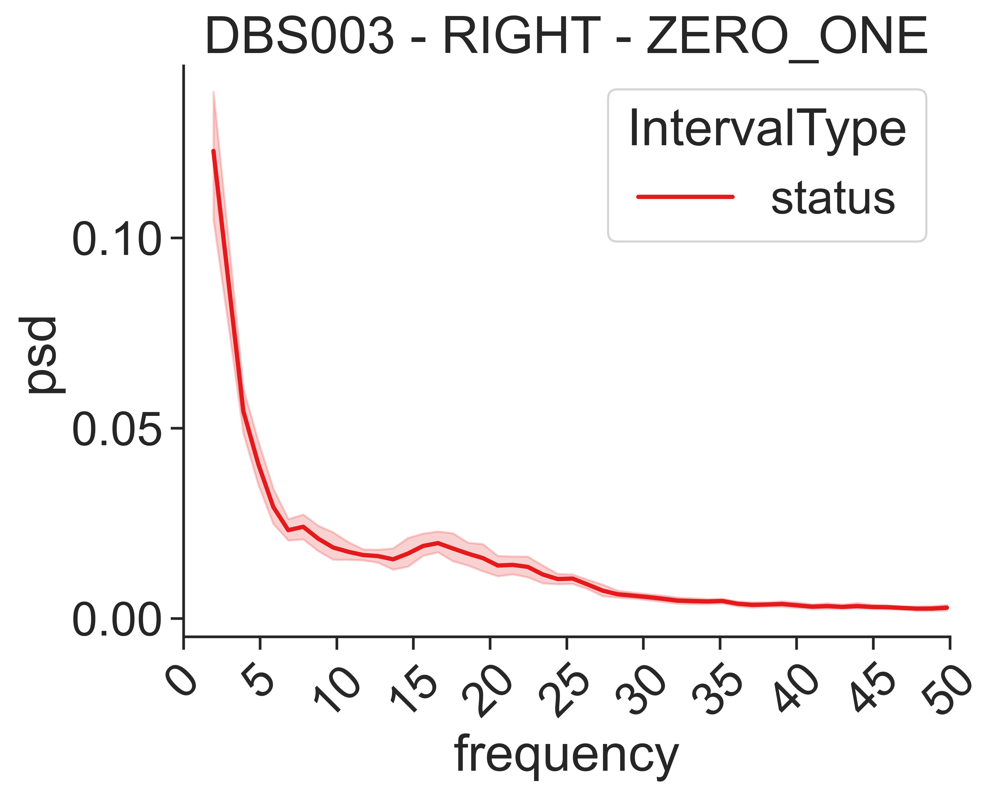

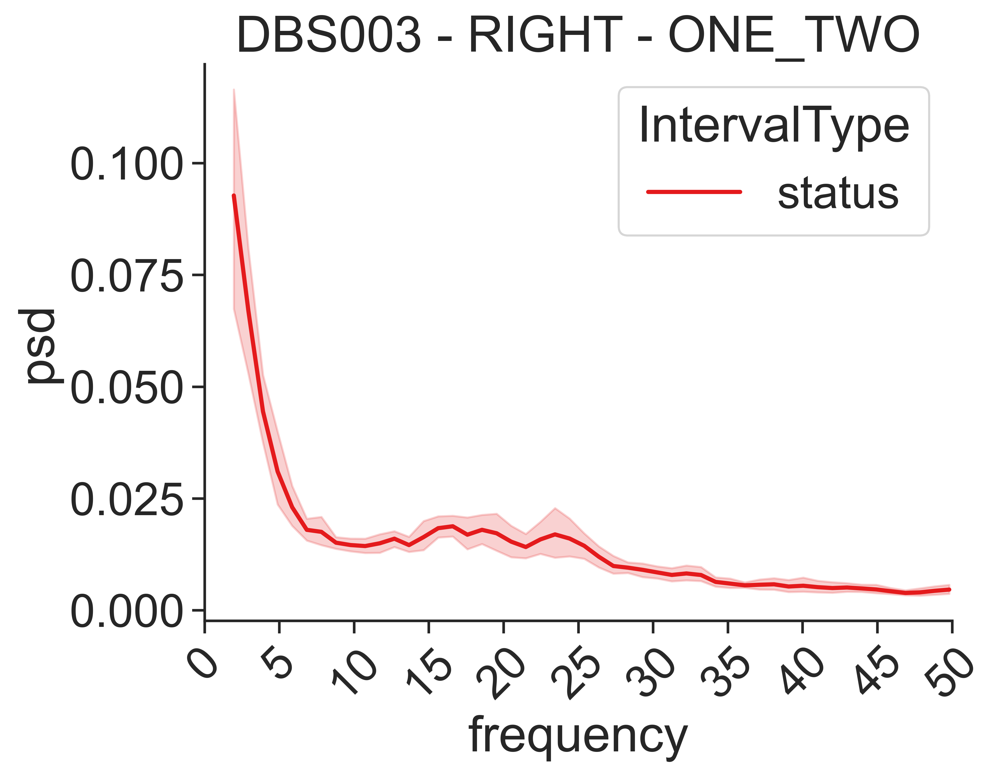

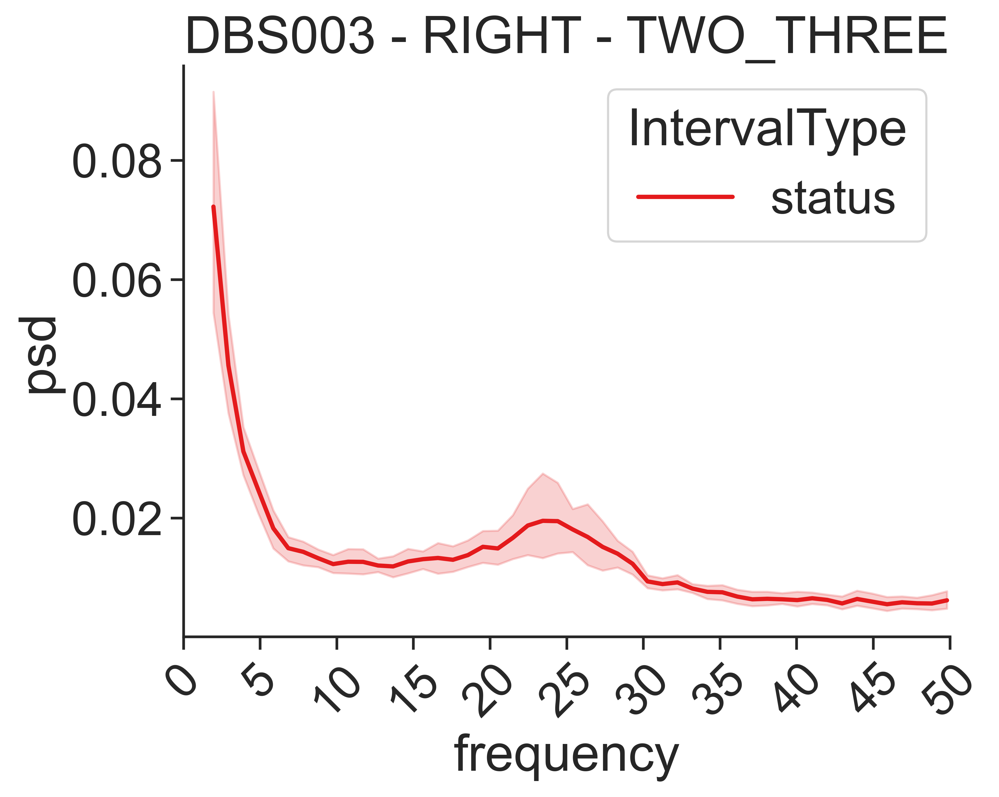

In [7]:
#PLOT ALL PSDs FOR ALL CHANNEL FOR SPECIFIC PATIENT AS ONE PLOT IN SEABORN
import seaborn as sns
PSD_df = pd.read_csv(resultsDir + resultsPSDFilename)
PSD_df['RecordingType'] = PSD_df['RecordingType'].replace('CT', 'CT (stim on)')

patList = ['DBS003']

hemisphere_channels_list = ['ZERO_THREE','ONE_THREE','ZERO_TWO','ZERO_ONE','ONE_TWO','TWO_THREE']

for patient in patList:
    for hemisphere in ['LEFT', 'RIGHT']:
        for channel in hemisphere_channels_list:
            patient_data = PSD_df[df['Patient'] == patient]
            if patient_data.empty:
                print('No data for patient', patient)
                continue

            patientPSDDataFileName = resultsPSDsDir + patient + '_' + hemisphere + '_' + channel + '_PSDs.csv'
            patient_PSD_df = pd.read_csv(patientPSDDataFileName)

            #just get the Interval type (Status vs OneYear) and PSD powers for each patient
            PSD_IDpowers = patient_PSD_df.drop(['Patient','Implant date','StatusDysStart','Discharge','RecordingStartTime','RecordingType','Channel'], axis=1)
            #only get the columns in the dataframe that have numbers as column names - these are the columns that have frequency values as their names
            freqs = [col for col in patient_PSD_df.columns if re.search(r'\d', col)]
            freqs_np = np.array(freqs)

            all_psds_melted = PSD_IDpowers.melt(id_vars=['IntervalType'], var_name = 'frequency', value_name = 'psd')
            all_psds_melted['frequency'] = all_psds_melted['frequency'].astype(float)

            #filter just 1-50Hz now, and only plot those
            all_psds_melted_filt = all_psds_melted[(all_psds_melted['frequency'] >= 1) & (all_psds_melted['frequency'] <= 50)]
            sns.lineplot(data=all_psds_melted_filt, x='frequency', y='psd', hue='IntervalType', palette='Set1', errorbar=('ci', 95))
            plt.xlim(1, 50)  # Set the x-axis limits from 1 to 50
            plt.xticks(np.arange(0, 55, 5), rotation=45)  # Set x-ticks starting from 0 to 50 with steps of 5
            plt.title(patient + ' - ' + hemisphere + ' - ' + channel)
            sns.despine()
            plt.show()

In [8]:
#Periodic component calculation - take individual patient's PSD files and then analyze the periodic (peak) components and store in file for analysis separately
from fooof import FOOOF
from fooof.plts.spectra import plot_spectra
fm_status = FOOOF() #Initialize a FOOOF object
fm_oneYear = FOOOF()
fm_PSD = FOOOF()
freq_range = [1, 80] #Set the frequency range to fit the model

#Load whole PSD data
PSD_df = pd.read_csv(resultsDir + resultsPSDFilename)
PSD_df['RecordingType'] = PSD_df['RecordingType'].replace('CT', 'CT (stim on)')

patList = PSD_df['Patient'].unique() #patList = ['DBS003'], hemisphere = 'RIGHT'

for hemisphere in ['LEFT', 'RIGHT']:
    for patient in patList:
        #Intialize peak paramater arrays
        peak_CFs = [] #central frequency
        peak_PWs = [] #peak power
        peak_BWs = [] #peak bandwidth
        aperiodic_off = [] #aperiodic offset
        aperiodic_exp = [] #aperiodic exponent

        patient_data = PSD_df[df['Patient'] == patient]
        if patient_data.empty:
            print('No data for patient', patient)
            continue
        patientPSDDataFileName = resultsPSDsDir + patient + '_' + hemisphere + '_PSDs.csv'
        patient_PSD_df = pd.read_csv(patientPSDDataFileName)

        #just get the standard information for each recording, minus the actual PSDs - then later will add the peak info as columns
        peak_df = patient_PSD_df[['Patient','Implant date','StatusDysStart','Discharge','RecordingStartTime','IntervalType','RecordingType','Channel']]

        #only get the columns in the dataframe that have numbers as column names - these are the columns that have frequency values as their names
        freqs = [col for col in patient_PSD_df.columns if re.search(r'\d', col)]
        freqs_np = np.array(freqs)
        #only get the PSW powers now from the larger PSD_df dataframe
        PSD_powers = patient_PSD_df[freqs]

        #Go through each individual recording's PSD (i.e. each row), and calculate peak params
        for index, row in PSD_powers.iterrows():
            PSD_row_np = np.array(row)
            fm_PSD.fit(freqs_np, PSD_row_np, freq_range)
            peak_params = fm_PSD.peak_params_
            aperiodic_params = fm_PSD.aperiodic_params_
            if peak_params.size == 0: #if no peaks, then store 0
                peak_CFs.append(0)
                peak_PWs.append(0)
                peak_BWs.append(0)
                aperiodic_off.append(aperiodic_params[0])
                aperiodic_exp.append(aperiodic_params[1])
                continue
            #find peak that has maximum PW and store this:
            PW_column = peak_params[:, 1]
            max_index = np.argmax(PW_column)
            max_PW_row = peak_params[max_index]
            peak_CFs.append(max_PW_row[0])
            peak_PWs.append(max_PW_row[1])
            peak_BWs.append(max_PW_row[2])
            aperiodic_off.append(aperiodic_params[0])
            aperiodic_exp.append(aperiodic_params[1])
        
        peak_df['Peak CF'] = peak_CFs
        peak_df['Peak PW'] = peak_PWs
        peak_df['Peak BW'] = peak_BWs
        peak_df['Aperiodic Offset'] = aperiodic_off
        peak_df['Aperiodic Exponent'] = aperiodic_exp

        #Store PSD peak data in new file
        patientPSDPeakDataFileName = resultsPSDPeaksDir + patient + '_' + hemisphere + '_PSDPeaks.csv'
        peak_df.to_csv(patientPSDPeakDataFileName, index=False)

        if patient == 'DBS003' and hemisphere == 'RIGHT':
            print(peak_df)

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:2: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF



FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a lower bound of approximately 2x the frequency resolution.


FOOOF WARNING: Lower-bound peak width limit is < or ~= the frequency resolution: 0.50 <= 0.98
	Lower bounds below frequency-resolution have no effect (effective lower bound is the frequency resolution).
	Too low a limit may lead to overfitting noise as small bandwidth peaks.
	We recommend a low

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak CF'] = peak_CFs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  peak_df['Peak PW'] = peak_PWs
/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_33535/1126948379.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_

/var/folders/qr/d2wxfs456fsf5lgfshrqbsmw0000gn/T/ipykernel_814/1643919473.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  status_data['RecordingStartTime'] = pd.to_datetime(status_data['RecordingStartTime'])


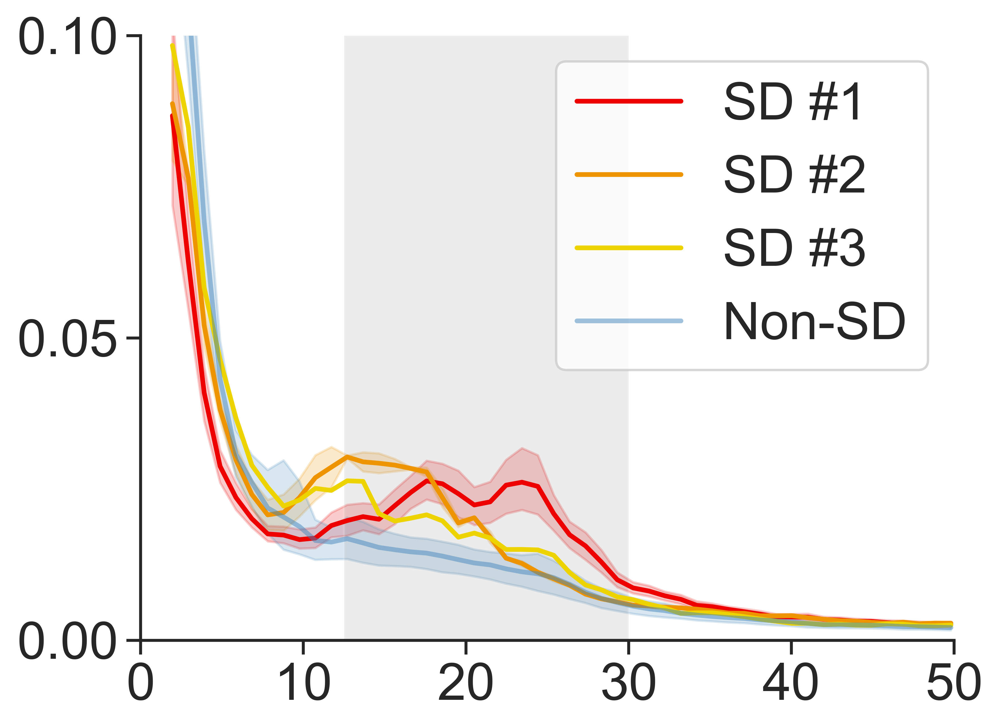

In [7]:
#PLOT MULTIPLE SD EPISODES TO CREATE FIGURE, FOR S001 AS EXAMPLE
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re

# Load the main PSD data
PSD_df = pd.read_csv(resultsDir + resultsPSDFilename)
PSD_df['RecordingType'] = PSD_df['RecordingType'].replace('CT', 'CT (stim on)')

# Set the filters for RecordingStartTime
time_filters = [
    ('2021-01-13 17:13:19', '2021-02-17 17:15:00'),  # SD #1
    ('2023-05-31 00:00:00', '2023-05-31 23:59:59'),  # SD #2
    ('2023-06-28 18:38:36', '2023-06-28 18:38:36')   # SD #3
]

# Specify the patient, hemisphere, and channel of interest
patient = 'DBS003'
hemisphere = 'RIGHT'
channel = 'ONE_THREE'

# Load the patient-specific PSD data
patientPSDDataFileName = resultsPSDsDir + f"{patient}_{hemisphere}_{channel}_PSDs.csv"
patient_PSD_df = pd.read_csv(patientPSDDataFileName)

# Filter data for 'status' and 'oneYear' IntervalTypes
status_data = patient_PSD_df[patient_PSD_df['IntervalType'] == 'status']
one_year_data = patient_PSD_df[patient_PSD_df['IntervalType'] == 'oneYear']

# Convert RecordingStartTime to datetime for filtering
status_data['RecordingStartTime'] = pd.to_datetime(status_data['RecordingStartTime'])

# Extract frequency columns
freqs = [col for col in status_data.columns if re.search(r'\d', col)]

# Melt the data for plotting
status_data_melted = status_data.melt(
    id_vars=['RecordingStartTime', 'IntervalType'], 
    value_vars=freqs, 
    var_name='frequency', 
    value_name='psd'
)
status_data_melted['frequency'] = status_data_melted['frequency'].astype(float)

one_year_data_melted = one_year_data.melt(
    id_vars=['RecordingStartTime', 'IntervalType'], 
    value_vars=freqs, 
    var_name='frequency', 
    value_name='psd'
)
one_year_data_melted['frequency'] = one_year_data_melted['frequency'].astype(float)

# Filter frequencies between 1 and 50 Hz
status_data_melted = status_data_melted[
    (status_data_melted['frequency'] >= 1) & (status_data_melted['frequency'] <= 50)
]
one_year_data_melted = one_year_data_melted[
    (one_year_data_melted['frequency'] >= 1) & (one_year_data_melted['frequency'] <= 50)
]

# Plot all time ranges and oneYear line
shades_of_red = ['#ED0000','#ED9400', '#EDD300']  # Different shades of red for status
labels = ['SD #1', 'SD #2', 'SD #3']  # Labels for status episodes

sns.set_style("ticks")
#sns.set_context("talk")
sns.set_context("notebook", font_scale=2.0, rc={"lines.linewidth": 2.0})

axs = []
for idx, (start_time, end_time) in enumerate(time_filters):
    filtered_data = status_data_melted[
        (status_data_melted['RecordingStartTime'] >= pd.to_datetime(start_time)) &
        (status_data_melted['RecordingStartTime'] <= pd.to_datetime(end_time))
    ]
    
    if not filtered_data.empty:
        ax = sns.lineplot(
            data=filtered_data, 
            x='frequency', 
            y='psd', 
            hue=None,  # Disable hue for this single overlayed plot
            palette=None,
            color=shades_of_red[idx], 
            label=labels[idx],
            errorbar=('ci', 95)
        )
        axs.append(ax)

# Add the oneYear data in light blue
ax2 = sns.lineplot(
    data=one_year_data_melted, 
    x='frequency', 
    y='psd',
    color='#4587BD',
    alpha=0.5,
    label='Non-SD',
    errorbar=('ci', 95)
)

axs.append(ax2)

# Add a grey shaded box from x = 12.5 to 30, covering the entire y-axis range
plt.axvspan(12.5, 30, facecolor='grey', alpha=0.15)

# Add plot details
for ax in axs:
    ax.set(xlabel=None)
    ax.set(ylabel=None)
plt.xlim(1, 50)
plt.ylim(0, 0.1)
plt.yticks(np.arange(0, 0.15, 0.05))
plt.xticks(np.arange(0, 60, 10))
plt.legend(loc='upper right')
sns.despine()
plt.tight_layout()
plt.show()


